In [1]:
import anndata
import numpy as np
import scipy as sp
import scvelo as scv
import scanpy as sc
import sys

import pandas as pd
import torch
import os
sys.path.append('../')
import topovelo as tpv
import matplotlib.pyplot as plt
from scipy.io import mmread, mmwrite

from numpy import savetxt
%load_ext autoreload
%autoreload 2

In [2]:
dataset = 'stereo-seq-lung'
data_path_base = '/nfs/turbo/umms-welchjd/yichen/data/TopoVelo/stereo_seq/lung_e10.5_13.5'
figure_path_base = '/nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5'
model_path_base = '/nfs/turbo/umms-welchjd/yichen/data/TopoVelo/stereo_seq/lung_e10.5_e13.5/checkpoints'

In [3]:
# adata = anndata.read_h5ad(f'{data_path_base}/adata_pp.h5ad')
adata = anndata.read_h5ad(f'{data_path_base}/adata_batchcorrected_out.h5ad')

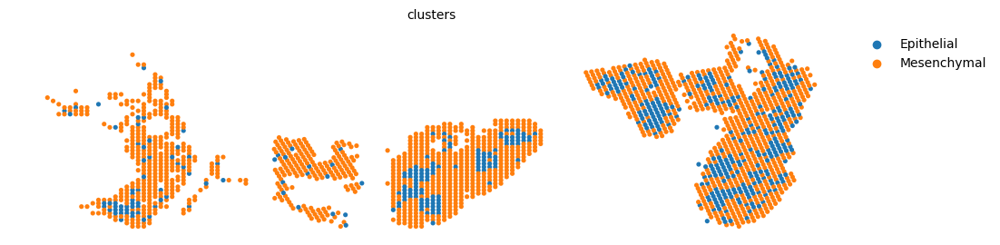

In [4]:
scv.pl.scatter(adata, basis='spatial', figsize=(12, 3))

# TopoVelo

Assign an informative time prior based on real time.

In [4]:
tprior = np.zeros((adata.n_obs))
batch = adata.obs['batch'].to_numpy()
tprior[batch == '0'] = 10.5
tprior[batch == '1'] = 11.5
tprior[batch == '2'] = 12.5
tprior[batch == '3'] = 13.5
adata.obs['tprior'] = tprior

In [25]:
figure_path = f'{figure_path_base}/tpv_batch'
model_path = f'{model_path_base}/tpv_batch'

torch.manual_seed(2022)
np.random.seed(2022)

vae = tpv.VAE(adata, 
              tmax=20, 
              dim_z=10, 
              dim_cond=4,
              device='cuda:0',
              init_method='tprior',
              init_key='tprior',
              tprior='tprior',
              ref_batch=3,
              batch_key='batch',
              graph_decoder=True,
              attention=False,
              reverse_gene_mode=False)
config = {
    'n_epochs': 2000,
    'learning_rate': 2e-4,
    'learning_rate_ode': 2e-3,
    'learning_rate_post': 2e-4
}
vae.train(adata,
          adata.obsp['spatial_graph'],
          'X_spatial',
          config=config,
          plot=False,
          figure_path=figure_path,
          embed='spatial')
# vae.save_model(model_path, 'encoder', 'decoder')
vae.save_anndata(adata, 'tpv', data_path_base, file_name="adata_batchcorrected_out.h5ad")

CVAE enabled. Performing batch effect correction.
Reference batch set to 3 (3).
Initialization using the steady-state and dynamical models.
Computing scaling_u factors for each batch class.
0.41901408450704225
Estimating ODE parameters...


  0%|          | 0/1420 [00:00<?, ?it/s]

Detected 544 velocity genes.
Estimating the variance...


  0%|          | 0/1420 [00:00<?, ?it/s]

Initial induction: 167, repression: 1253/1420
Initialization using prior time.
Reinitialize the regular ODE parameters based on estimated global latent time.


  0%|          | 0/1420 [00:00<?, ?it/s]

Using informative time prior.
--------------------------- Train a TopoVelo ---------------------------
*********               Creating a Graph Dataset              *********
*********                      Finished.                      *********
*********                 Creating optimizers                 *********
*********                      Finished.                      *********
*********                    Start training                   *********
*********                      Stage  1                       *********
*********       Stage 1: Early Stop Triggered at epoch 321.       *********
Summary: 
Train ELBO = 2204.905
Test ELBO = 2174.329
Total Time =   0 h :  1 m : 11 s

*********                      Stage  2                       *********
*********             Velocity Refinement Round 1              *********


  0%|          | 0/2182 [00:00<?, ?it/s]

Percentage of Invalid Sets: 0.052
Average Neighborhood Size: 48.2
Average Set Size: 12.3
Summary: 
Train ELBO = 4267.887
Test ELBO = 3918.917
Total Time =   0 h :  1 m : 27 s

*********       Round 1: Early Stop Triggered at epoch 391.       *********
Change in noise variance: 0.4113
*********             Velocity Refinement Round 2              *********
Summary: 
Train ELBO = 3841.327
Test ELBO = 3901.328
Total Time =   0 h :  1 m : 31 s

*********       Round 2: Early Stop Triggered at epoch 408.       *********
Change in noise variance: 0.0001
Change in x0: 0.0993
*********             Velocity Refinement Round 3              *********
Summary: 
Train ELBO = 3960.421
Test ELBO = 3877.962
Total Time =   0 h :  1 m : 35 s

*********       Round 3: Early Stop Triggered at epoch 425.       *********
Change in noise variance: 0.0000
Change in x0: 0.0802
*********             Velocity Refinement Round 4              *********
Summary: 
Train ELBO = 4035.713
Test ELBO = 3866.699
Total Tim

VAE with graph attention

In [26]:
figure_path = f'{figure_path_base}/gat_batch'
model_path = f'{model_path_base}/gat_batch'

torch.manual_seed(2022)
np.random.seed(2022)

vae = tpv.VAE(adata, 
              tmax=20, 
              dim_z=10, 
              dim_cond=4,
              device='cuda:0',
              init_method='tprior',
              init_key='tprior',
              tprior='tprior',
              ref_batch=3,
              batch_key='batch',
              graph_decoder=True,
              attention=True,
              reverse_gene_mode=False)
config = {
    'n_epochs': 2000,
    'learning_rate': 2e-4,
    'learning_rate_ode': 2e-3,
    'learning_rate_post': 2e-4
}
vae.train(adata,
          adata.obsp['spatial_graph'],
          'X_spatial',
          config=config,
          plot=False,
          figure_path=figure_path,
          embed='spatial')
vae.save_model(model_path, 'encoder', 'decoder')
vae.save_anndata(adata, 'gat', data_path_base, file_name="adata_batchcorrected_out.h5ad")


CVAE enabled. Performing batch effect correction.
Reference batch set to 3 (3).
Initialization using the steady-state and dynamical models.
Computing scaling_u factors for each batch class.
0.41901408450704225
Estimating ODE parameters...


  0%|          | 0/1420 [00:00<?, ?it/s]

Detected 544 velocity genes.
Estimating the variance...


  0%|          | 0/1420 [00:00<?, ?it/s]

Initial induction: 167, repression: 1253/1420
Initialization using prior time.
Reinitialize the regular ODE parameters based on estimated global latent time.


  0%|          | 0/1420 [00:00<?, ?it/s]

Using informative time prior.
--------------------------- Train a TopoVelo ---------------------------
*********               Creating a Graph Dataset              *********
*********                      Finished.                      *********
*********                 Creating optimizers                 *********
*********                      Finished.                      *********
*********                    Start training                   *********
*********                      Stage  1                       *********
*********       Stage 1: Early Stop Triggered at epoch 288.       *********
Summary: 
Train ELBO = 2252.212
Test ELBO = 2226.105
Total Time =   0 h :  3 m : 13 s

*********                      Stage  2                       *********
*********             Velocity Refinement Round 1              *********


  0%|          | 0/2182 [00:00<?, ?it/s]

Percentage of Invalid Sets: 0.019
Average Neighborhood Size: 48.2
Average Set Size: 13.3
Summary: 
Train ELBO = 4211.220
Test ELBO = 4000.488
Total Time =   0 h :  3 m : 44 s

*********       Round 1: Early Stop Triggered at epoch 327.       *********
Change in noise variance: 0.4254
*********             Velocity Refinement Round 2              *********
Summary: 
Train ELBO = 3889.383
Test ELBO = 3984.536
Total Time =   0 h :  3 m : 50 s

*********       Round 2: Early Stop Triggered at epoch 335.       *********
Change in noise variance: 0.0003
Change in x0: 0.1714
*********             Velocity Refinement Round 3              *********
Summary: 
Train ELBO = 3967.690
Test ELBO = 3954.935
Total Time =   0 h :  3 m : 55 s

*********       Round 3: Early Stop Triggered at epoch 343.       *********
Change in noise variance: 0.0000
Change in x0: 0.1499
*********             Velocity Refinement Round 4              *********
Summary: 
Train ELBO = 4121.934
Test ELBO = 3930.947
Total Tim

# scVelo

In [8]:
scv.tl.recover_dynamics(adata, n_jobs=12)
scv.pp.neighbors(adata)
scv.tl.velocity(adata, mode='dynamical')
scv.tl.velocity_graph(adata)
scv.tl.latent_time(adata)


recovering dynamics (using 12/32 cores)


  0%|          | 0/1150 [00:00<?, ?gene/s]

    finished (0:01:56) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing neighbors
    finished (0:00:02) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing velocities
    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/32 cores)


  0%|          | 0/2182 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 8 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


In [9]:
adata.write_h5ad(f'{data_path_base}/adata_batchcorrected_out.h5ad')


In [25]:
adata = anndata.read_h5ad(f'{data_path_base}/adata_batchcorrected_out.h5ad')


['Ankfy1']
---   Plotting  Results   ---


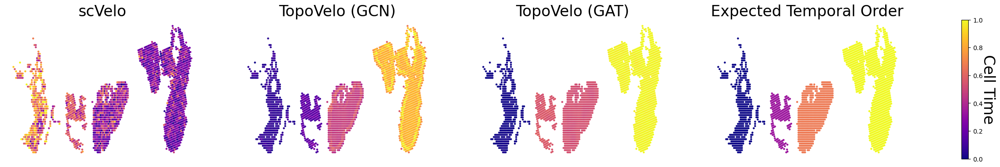

In [23]:
(res, res_type,
 res_multi, res_multi_type) = tpv.post_analysis(adata,
                                                'lung',
                                                ['scVelo', 'TopoVelo (GCN)', 'TopoVelo (GAT)'],
                                                ['fit', 'tpv', 'gat'],
                                                spatial_graph_key='spatial_graph',
                                                spatial_key='X_spatial',
                                                compute_metrics=False,
                                                spatial_velocity_graph=True,
                                                embed='spatial',
                                                plot_type=['time'],
                                                cluster_edges=[('Epithelial', 'Mesenchymal')],
                                                figure_path=figure_path_base,
                                                save_format='pdf')

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
['Ankfy1']
---   Plotting  Results   ---
computing velocity graph (using 1/32 cores)


  0%|          | 0/411 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e10.5_scv.png


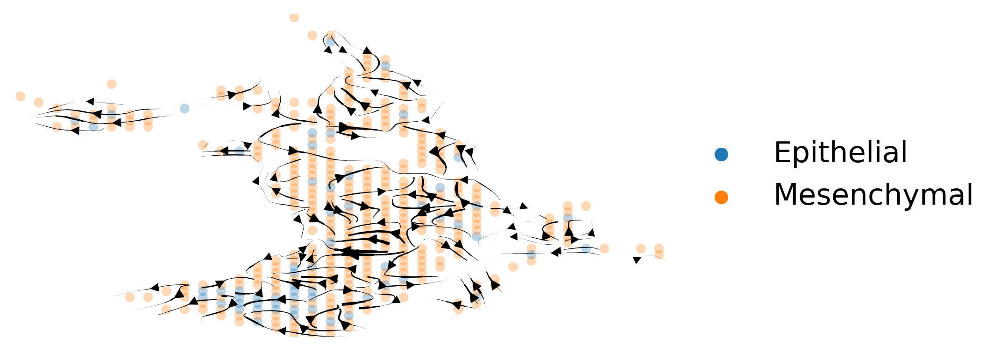

computing velocity graph (using 1/32 cores)


  0%|          | 0/411 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'tpv_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'tpv_velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e10.5_tpv.png


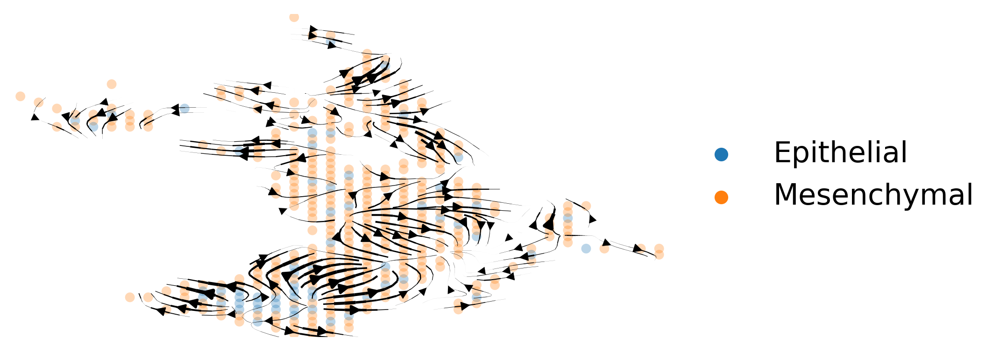

saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e10.5_tpv_true_velocity.png


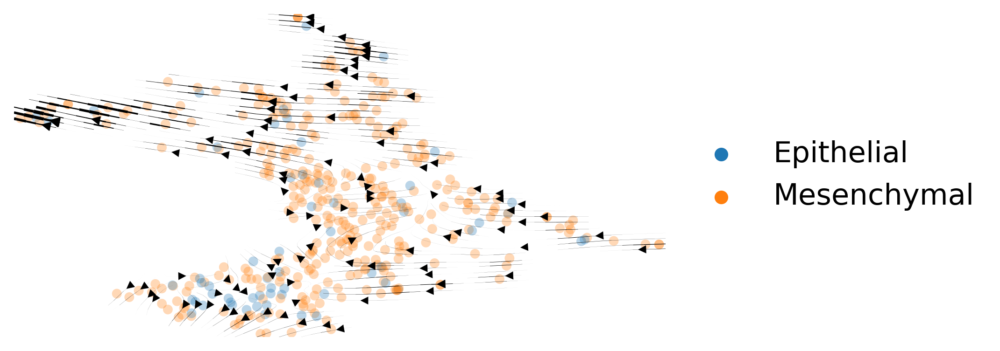

computing velocity graph (using 1/32 cores)


  0%|          | 0/411 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'gat_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'gat_velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e10.5_gat.png


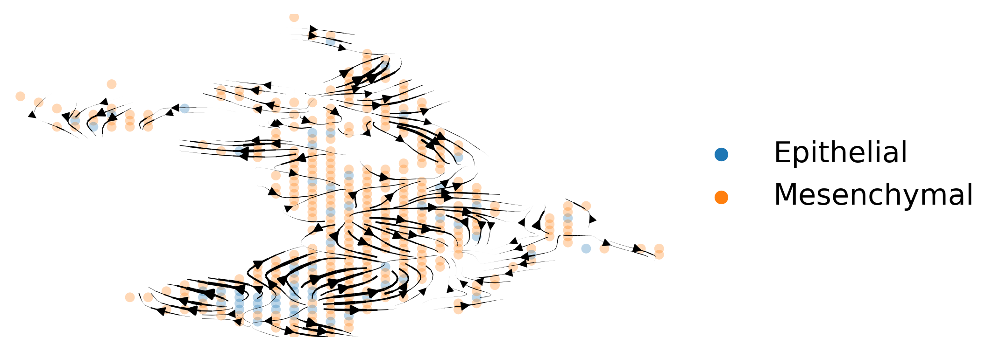

saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e10.5_gat_true_velocity.png


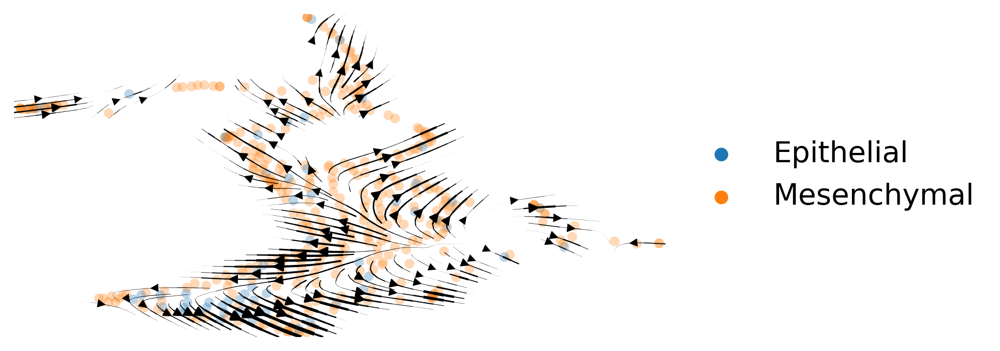

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
['Ankfy1']
---   Plotting  Results   ---
computing velocity graph (using 1/32 cores)


  0%|          | 0/193 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e11.5_scv.png


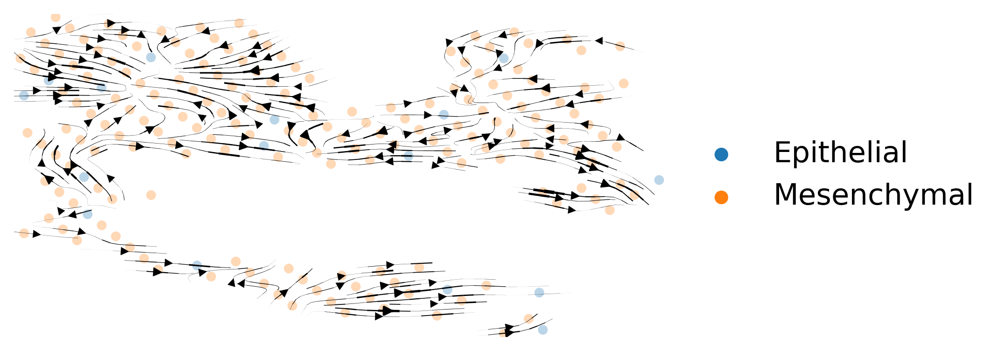

computing velocity graph (using 1/32 cores)


  0%|          | 0/193 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'tpv_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'tpv_velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e11.5_tpv.png


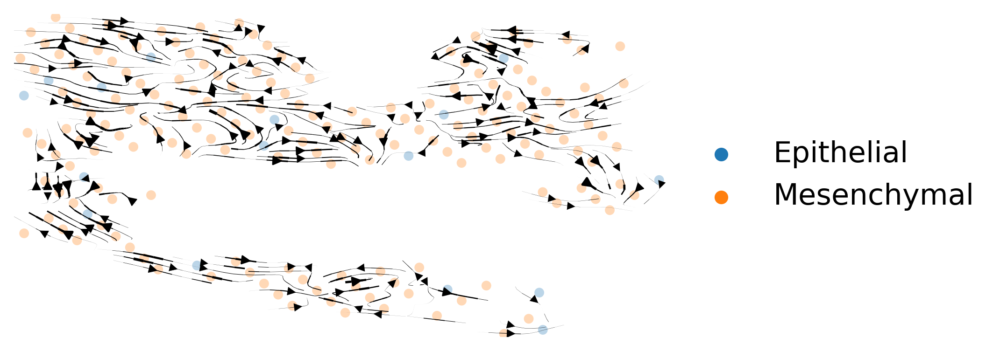

saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e11.5_tpv_true_velocity.png


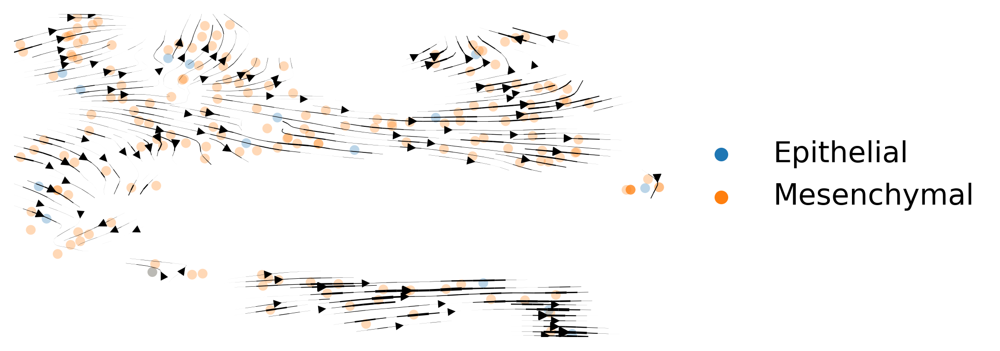

computing velocity graph (using 1/32 cores)


  0%|          | 0/193 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'gat_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'gat_velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e11.5_gat.png


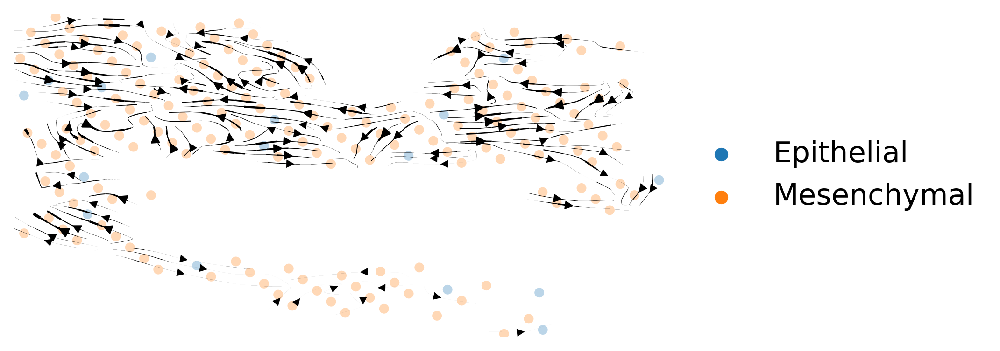

saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e11.5_gat_true_velocity.png


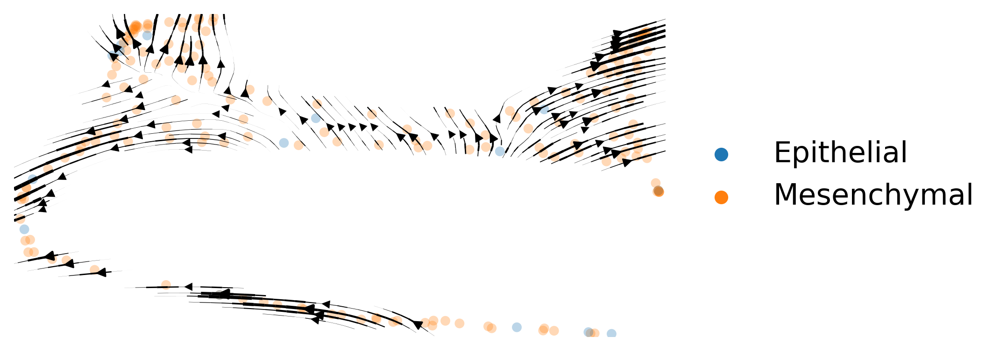

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
['Ankfy1']
---   Plotting  Results   ---
computing velocity graph (using 1/32 cores)


  0%|          | 0/559 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e12.5_scv.png


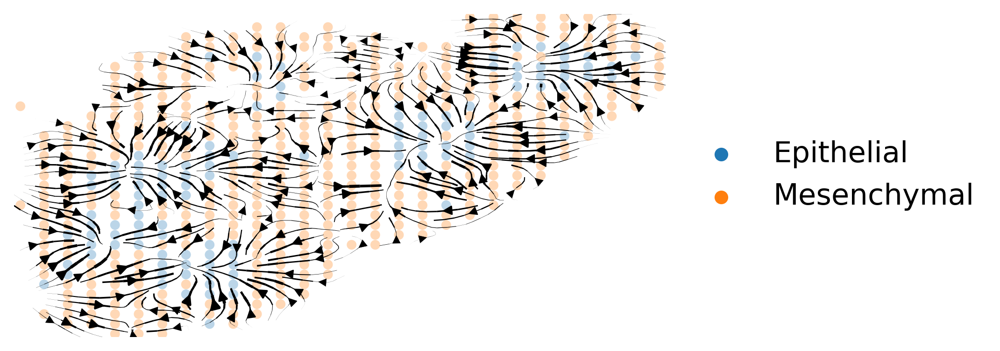

computing velocity graph (using 1/32 cores)


  0%|          | 0/559 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'tpv_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'tpv_velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e12.5_tpv.png


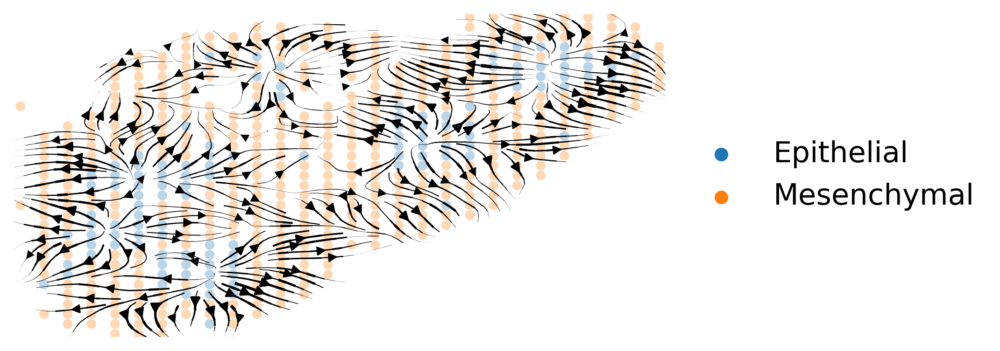

saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e12.5_tpv_true_velocity.png


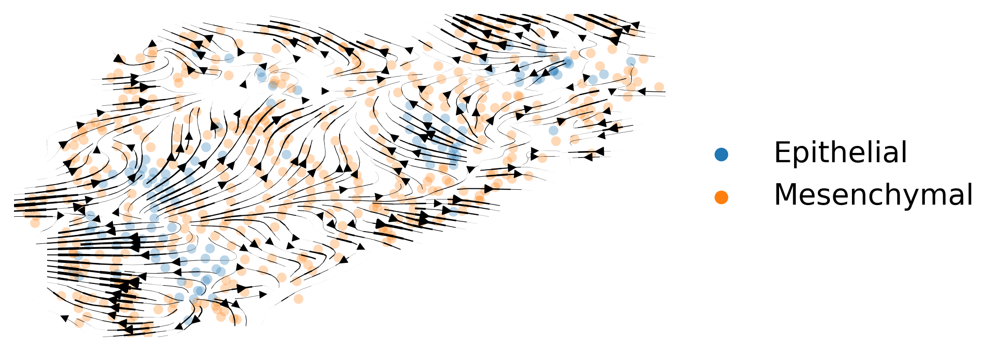

computing velocity graph (using 1/32 cores)


  0%|          | 0/559 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'gat_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'gat_velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e12.5_gat.png


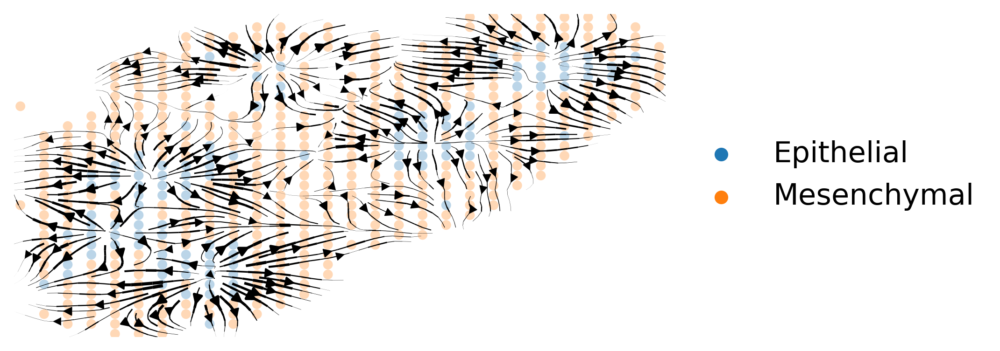

saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e12.5_gat_true_velocity.png


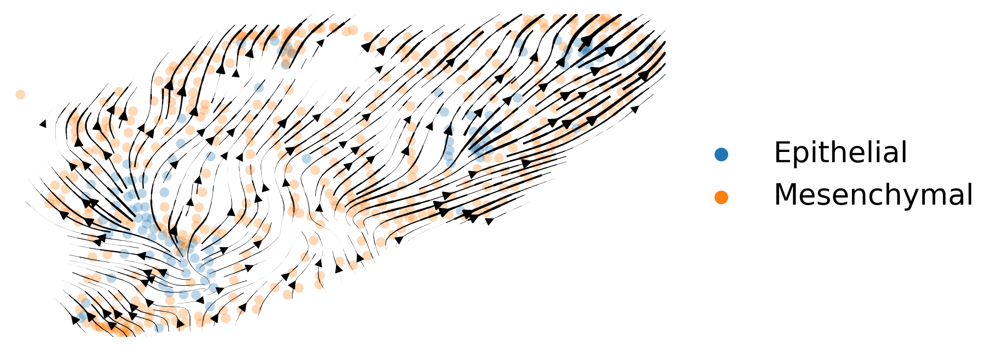

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
['Ankfy1']
---   Plotting  Results   ---
computing velocity graph (using 1/32 cores)


  0%|          | 0/1019 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e13.5_scv.png


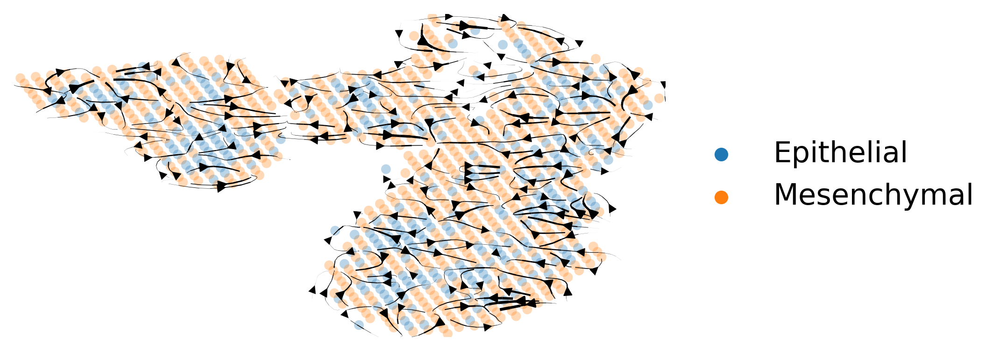

computing velocity graph (using 1/32 cores)


  0%|          | 0/1019 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'tpv_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'tpv_velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e13.5_tpv.png


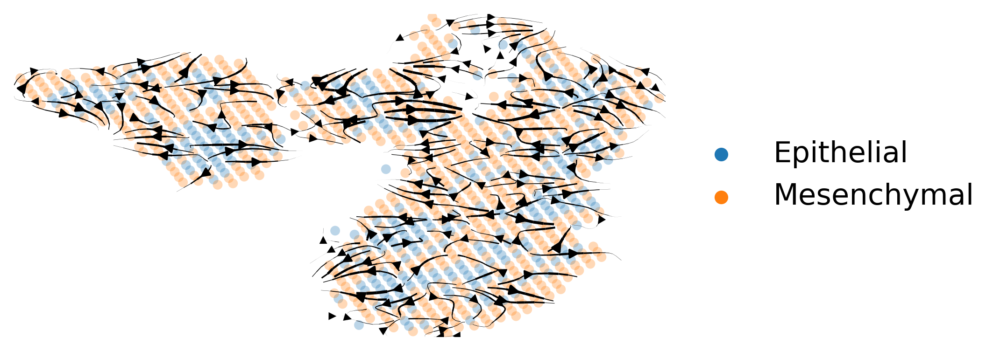

saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e13.5_tpv_true_velocity.png


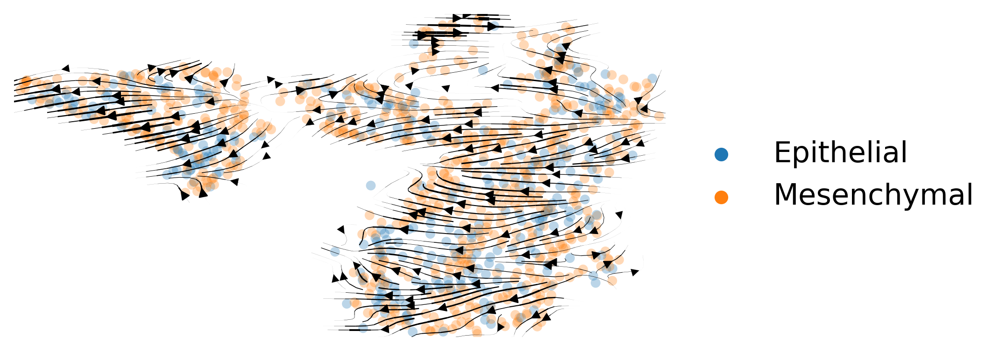

computing velocity graph (using 1/32 cores)


  0%|          | 0/1019 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'gat_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'gat_velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e13.5_gat.png


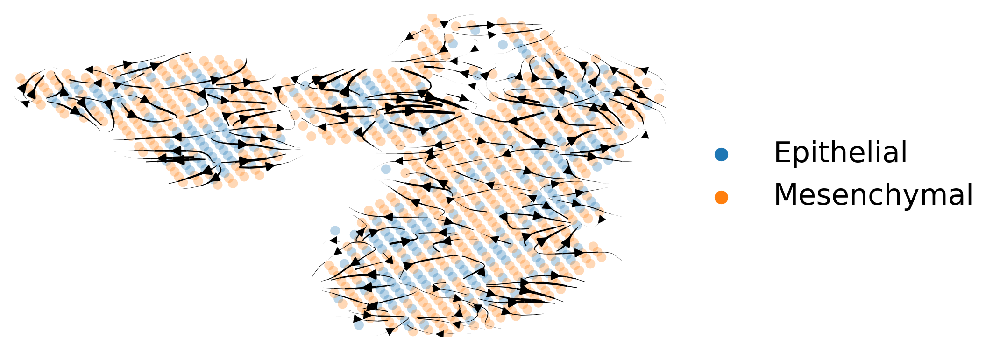

saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/stereo_seq/lung_e10.5_13.5/batchcorrected_lung_e13.5_gat_true_velocity.png


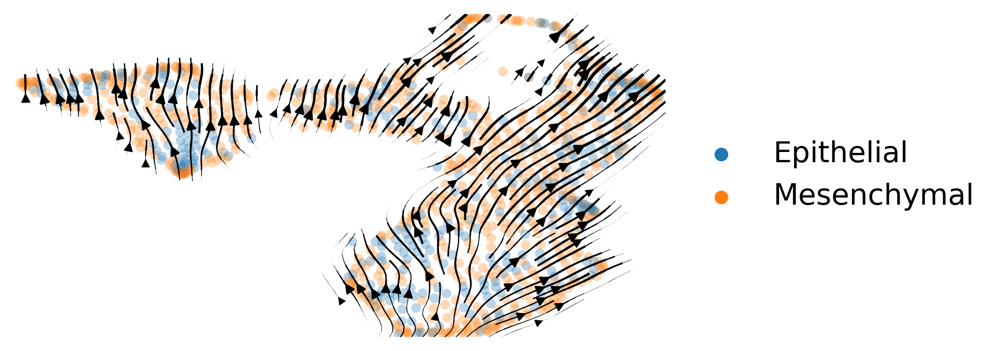

In [24]:
# del adata.obs['tprior']
slice_label = adata.obs['batch'].to_numpy()
for i, slc in enumerate(['0', '1', '2', '3']):
    adata_sub = adata[slice_label == slc]
    scv.pp.neighbors(adata_sub)
    (res, res_type,
     res_multi, res_multi_type) = tpv.post_analysis(adata_sub,
                                                    f'batchcorrected_lung_e{10.5+i}',
                                                    ['scVelo', 'TopoVelo (GCN)', 'TopoVelo (GAT)'],
                                                    ['scv', 'tpv', 'gat'],
                                                    spatial_graph_key='spatial_graph',
                                                    spatial_key='X_spatial',
                                                    compute_metrics=False,
                                                    spatial_velocity_graph=True,
                                                    embed='spatial',
                                                    plot_type=['stream'],
                                                    dpi=300,
                                                    dot_size=100,
                                                    alpha=0.5,
                                                    figure_path=figure_path_base,
                                                    stream_legend_loc='right margin',
                                                    stream_figsize=(6, 3))
    # perf_logger.insert(f'Gut E{10.5+i}', res, res_type, res_multi, res_multi_type)
    